<div class="alert alert-block alert-danger">
    <b> UNTANGLING THE CYTOSKELETON: A MODEL TO DESCRIBE CYTOSKELETAL ORGANIZATION - CODE</b> 
    
 **2 - CYTOSKELETON PREPROCESSING**
    
**Author**: Diogo Fróis Vieira
</div>

<div class="alert alert-block alert-info">
    
 **IMPORTS**
    
</div>

In [1]:
# IMPORTS
import os
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.display import display
import sys
sys.path.append(os.path.abspath('..'))
from packageCYSK.importing import *
from packageCYSK.preprocessingCYTO import *

print('📚 All libraries successfully imported 📚')

📚 All libraries successfully imported 📚


<div class="alert alert-block alert-info">
    
 **DIRECTORIES**
    
</div>

In [2]:
# Define dataset folder.
folder      = os.getcwd() + "\\data"

# Import images from CYTO folders.
options     = ["CYTO"]

# Dictionary with key "CYTO"
data = init_import(folder,options)

#data['CYTO_PRE'] = pd.read_pickle(folder + "\\CYTO_PRE\\CYTO_PRE.pkl") 

Voxel depth (Z-spacing) could not be determined. Set to 1 (default).
>>> [CYTO] added.


In [3]:
data['CYTO']

,Path,Name,Label,Label 2,Resolution,Image,Image Size
HPA,C:\Users\diogo\OneDrive - Universidade de Lisb...,Cells_HPA_Cells_abc.tif,Cells,abc.tif,"(1, 0.08, 0.08)","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","(2048, 2048)"


<div class="alert alert-block alert-info">
    
 **INSTRUCTIONS**
    
</div>

**1.** Select an image.

**2.** Perform cytoskeleton preprocessing to the selected image. Tune the necessary parameters. Once satisfied with the results, save the textures and skeletons on ```data['CYTO_PRE']```. 

**3.** If you have a dataset of images, repeat this process with another image. In the end, ```data['CYTO_PRE']``` must be filled with cytoskeletons (textures and skeletons) identified from multiple images. 

**4.** Save the final dataframe.

<div class="alert alert-block alert-info">
    
 **SELECT IMAGE**
    
</div>

In [3]:
def dropdown_image_eventhandler(change):
    global idx
    idx = dropdown_image.value
    lab = data['CYTO']['Label'][dropdown_image.value]
    print('Image ' + str(idx) + ' (' + str(lab) +') selected.')

dropdown_image = widgets.Dropdown(description =  'Select Image:' , options = ['...'] + list(data['CYTO'].index))
dropdown_image.observe(dropdown_image_eventhandler, names='value')
display(dropdown_image)

Dropdown(description='Select Image:', options=('...', 'HPA'), value='...')

Image HPA (Cells) selected.


<div class="alert alert-block alert-info">
    
 **CYTOSKELETON PREPROCESSING**
    
</div>

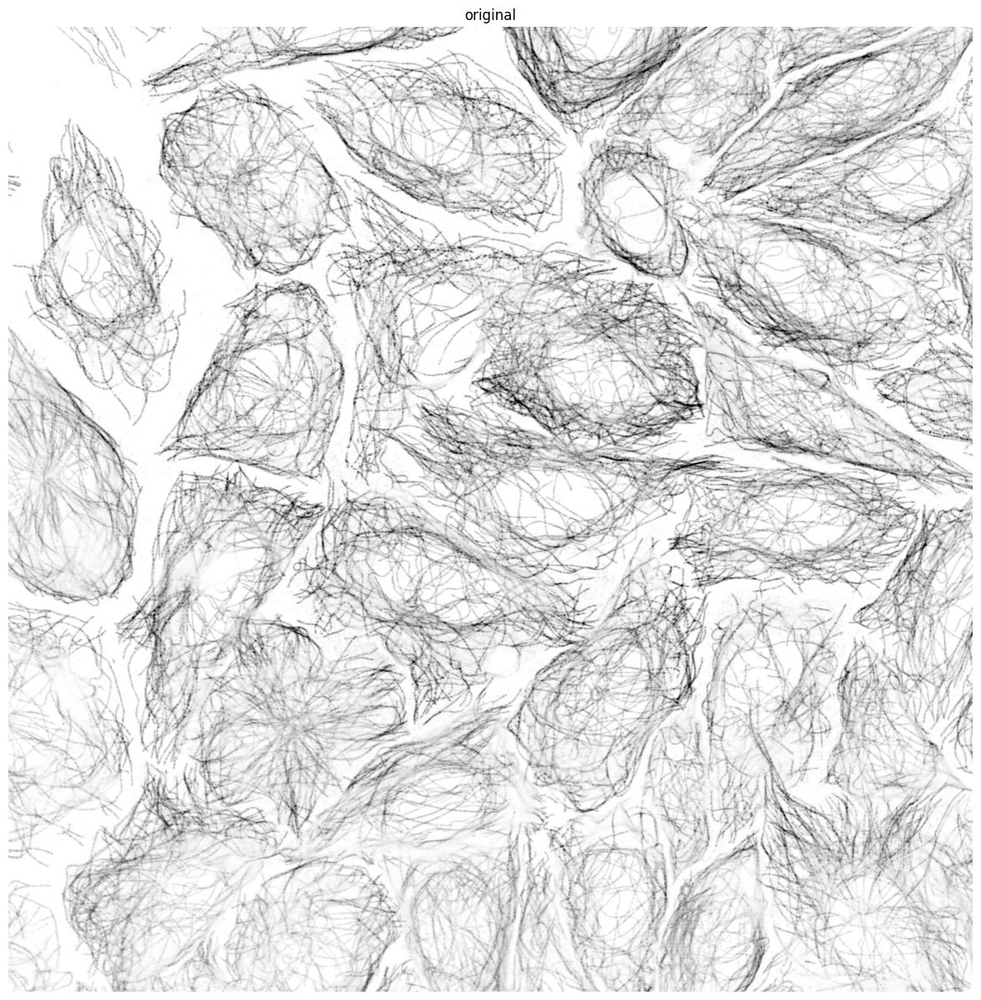

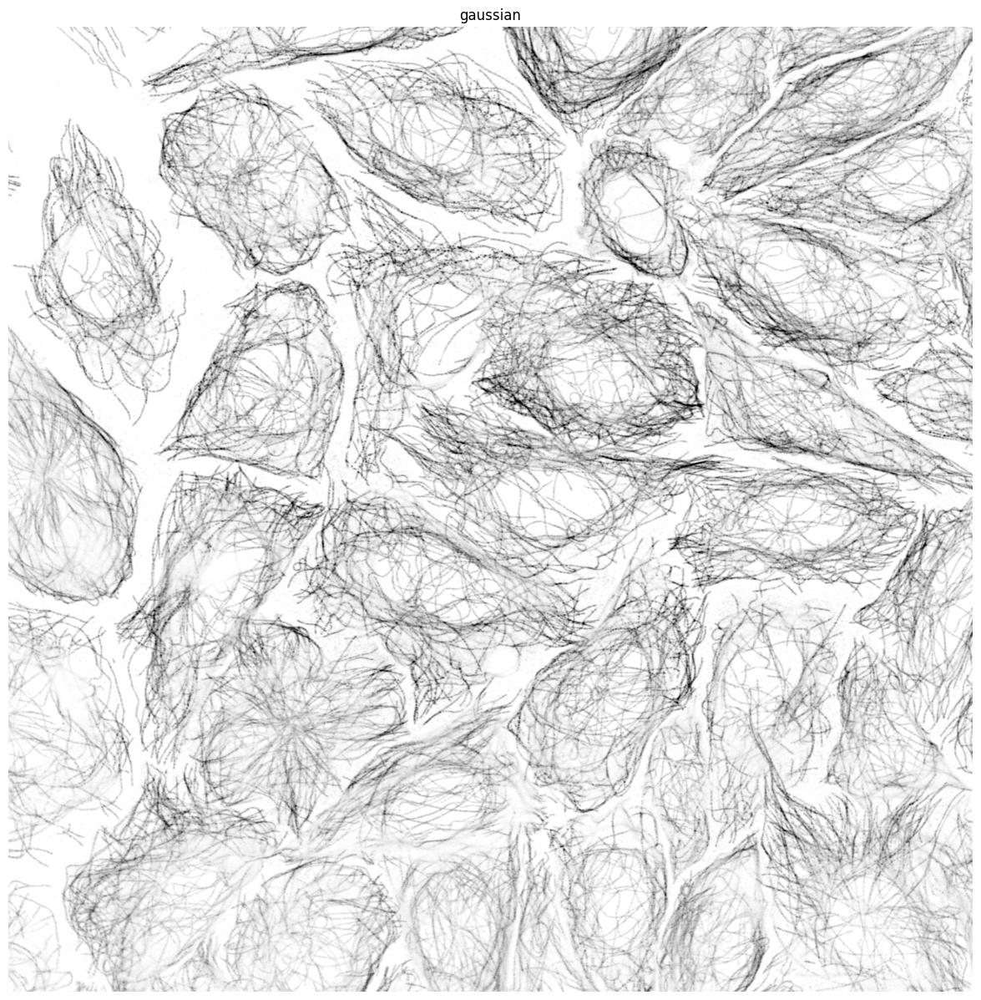

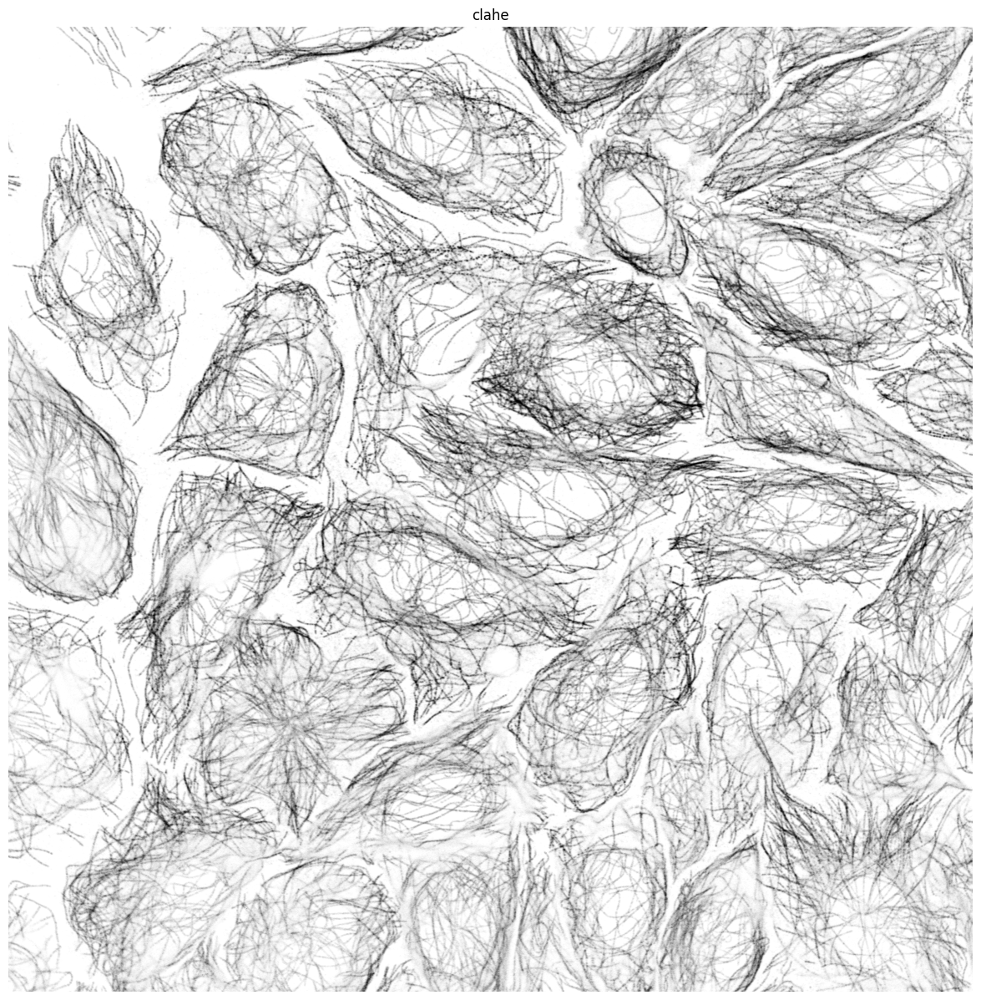

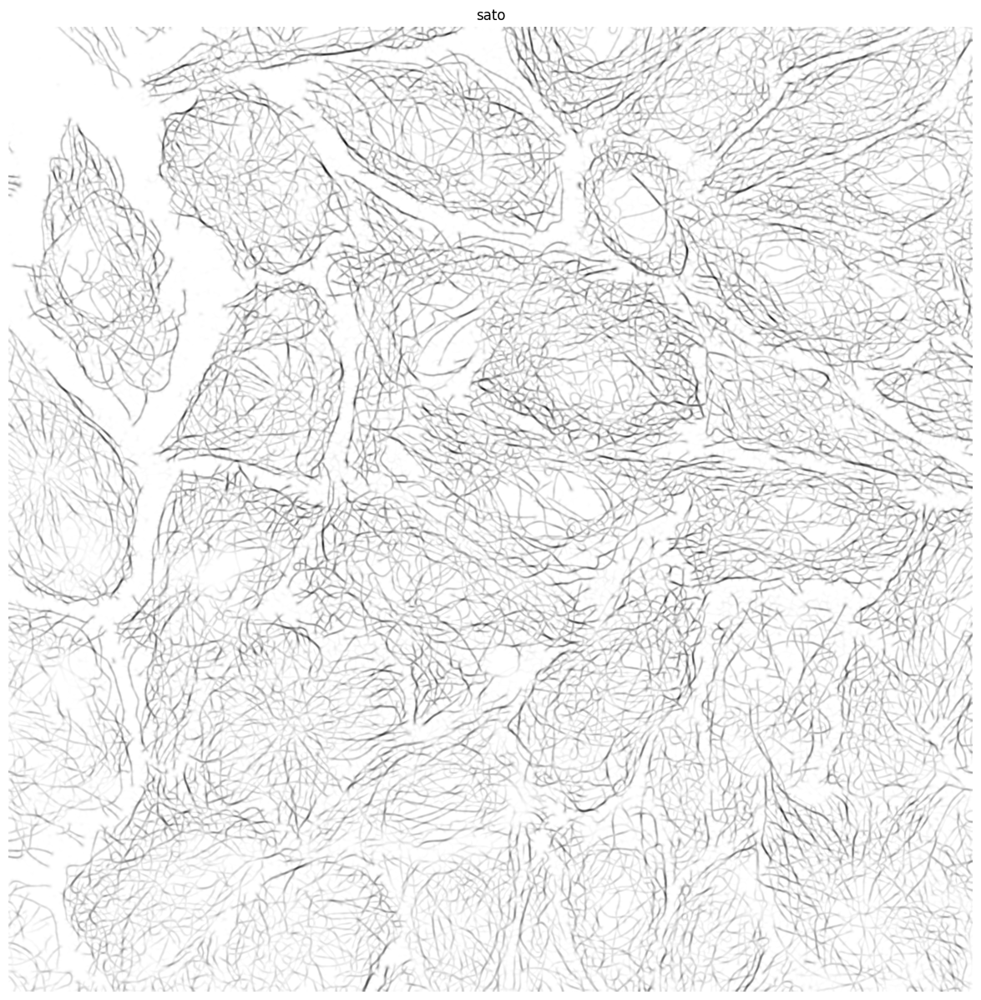

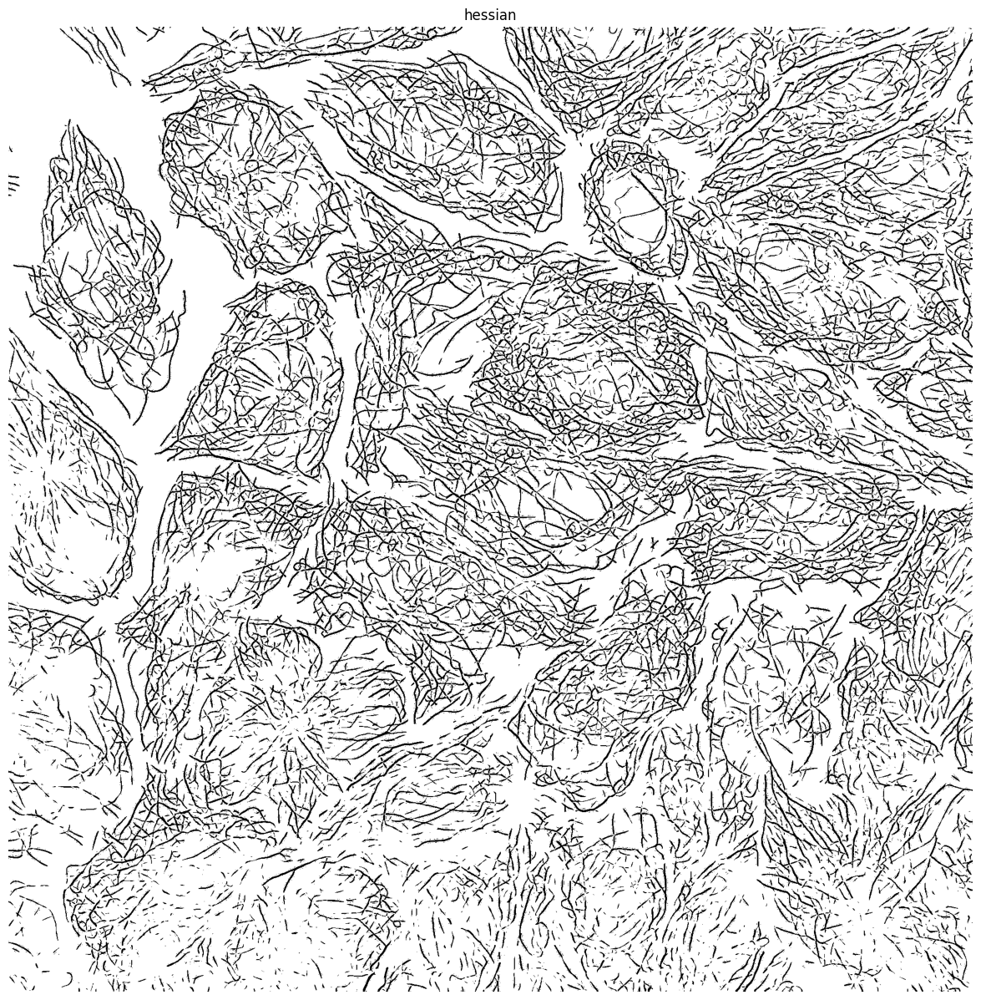

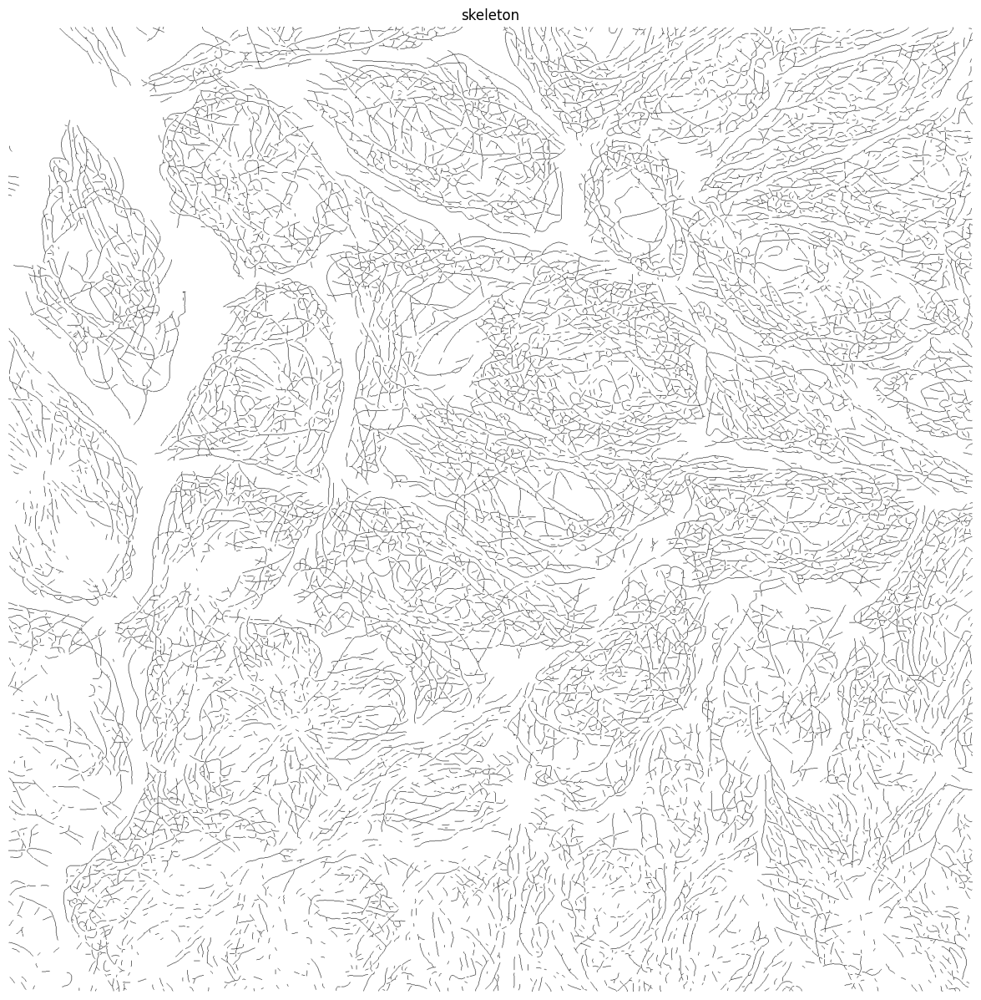

In [5]:
data['CYTO_PRE'],imagens = cytoskeleton_preprocessing_hpa(rowCYTO = data['CYTO'].loc[idx],
                                                       parameters = {'gau_sigma': 0,
                                                                     'clahe_clip': 0.005,
                                                                     'sato_sigma': 3,
                                                                     'hess_sigma': 0.33},
                                                             plot = True,
                                                             save = False) #save=folder+"\\" + str(image_id))


In [6]:
data['CYTO_PRE']

,Path,Name,Img Index,Label,Image Size,Texture,Skeleton
HPA,C:\Users\diogo\OneDrive - Universidade de Lisb...,Cells_HPA_Cells_abc.tif,HPA,Cells,"(2048, 2048)","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
HPA,C:\Users\diogo\OneDrive - Universidade de Lisb...,Cells_HPA_Cells_abc.tif,HPA,Cells,"(2048, 2048)","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


<div class="alert alert-block alert-info">
    
 **SAVE DATAFRAME**
    
</div>

In [8]:
data['CYTO_PRE'].to_pickle(folder + "//CYTO_PRE//CYTO_PRE_TEST2.pkl")

---